In [1]:
%load_ext autoreload
%autoreload 2

In [16]:
from gensim.models.ldamodel import LdaModel
from ObjectivelyFunny.LDA_trainer import LDATrainer
from ObjectivelyFunny.pipeline import set_pipeline
from ObjectivelyFunny.data import get_data, sent_to_words
from ObjectivelyFunny import word_selections

In [9]:
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
lda = LdaModel.load('../model')

In [7]:
lda

In [12]:
id2word = Dictionary.load('../model.id2word')

In [17]:
df = get_data(gender=[1])
print('Data acquired')
clean_steps = ['music', 'brackets', 'lowercase', 'regex', 'numbers', 'uncensor', 'remove', 'punctuation',
'lemmatizer', 'manual_lemmatize', 'remove2']
clean_df = set_pipeline(clean_steps,
                dropword_list = word_selections.standard_dropword_list + word_selections.decade_dropword_list
                ).fit_transform(df)
print('Dataframe cleaned')

model = LDATrainer()
model.make_words(clean_df).make_grams().make_dictionary()
print('Gram dictionary made')
model.run()
print('complete')

Data acquired


[nltk_data] Downloading package stopwords to /home/rei/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/home/rei/code/rmelbardis/ObjectivelyFunny/ObjectivelyFunny/preprocessing.py:161: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  X['full_transcript'] = X['full_transcript'].str.replace(punc, '')
[nltk_data] Downloading package stopwords to /home/rei/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Dataframe cleaned
Gram dictionary made
complete


In [18]:
lda.print_topics()

[(6,
  '0.001*"tension" + 0.001*"picasso" + 0.001*"art_history" + 0.000*"tasmania" + 0.000*"feedback" + 0.000*"cubism" + 0.000*"straight_white" + 0.000*"homosexuality" + 0.000*"lesbian_content" + 0.000*"perspective"'),
 (22,
  '0.000*"love" + 0.000*"thought" + 0.000*"god" + 0.000*"girl" + 0.000*"something" + 0.000*"kid" + 0.000*"every" + 0.000*"yes" + 0.000*"life" + 0.000*"men"'),
 (28,
  '0.000*"love" + 0.000*"girl" + 0.000*"thought" + 0.000*"god" + 0.000*"something" + 0.000*"yes" + 0.000*"kid" + 0.000*"friend" + 0.000*"men" + 0.000*"every"'),
 (13,
  '0.000*"girl" + 0.000*"love" + 0.000*"thought" + 0.000*"something" + 0.000*"friend" + 0.000*"yes" + 0.000*"god" + 0.000*"every" + 0.000*"men" + 0.000*"baby"'),
 (23,
  '0.000*"britain" + 0.000*"flag_george" + 0.000*"owwwn" + 0.000*"raked" + 0.000*"sid" + 0.000*"hullo" + 0.000*"workforce" + 0.000*"newcastle" + 0.000*"highstakes" + 0.000*"citizenship"'),
 (12,
  '0.000*"love" + 0.000*"taylor_swift" + 0.000*"thought" + 0.000*"girl" + 0.000*

In [19]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda, model.corpus, model.id2word, mds='mmds')
vis

/home/rei/.pyenv/versions/3.8.12/envs/objectively_funny/lib/python3.8/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.158244  0.080259       1        1  77.728738
24    -0.284170 -0.122417       2        1  18.325724
15     0.016921 -0.005814       3        1   0.731595
5      0.019062 -0.002732       4        1   0.681012
2      0.011183 -0.001800       5        1   0.602958
16     0.019263  0.004593       6        1   0.585986
14     0.016132  0.004208       7        1   0.372452
6      0.017101  0.001157       8        1   0.303957
23     0.015148  0.001743       9        1   0.079347
10     0.014875  0.002174      10        1   0.056431
8      0.014953  0.001915      11        1   0.025382
11     0.014812  0.001964      12        1   0.025372
29     0.014887  0.001851      13        1   0.025323
7      0.014885  0.001842      14        1   0.025318
12     0.014887  0.001836      15        1   0.025318
28     0.014889  0.001841      16        1   0.025318
26     0.014895  0.001834      17        1   0.025318
1      0.014891  0.001808      18        1   0.025318
20     0.014895  0.001830      19        1   0.025318
27     0.014896  0.001845      20        1   0.025318
4      0.014897  0.001840      21        1   0.025318
22     0.014889  0.001830      22        1   0.025318
9      0.014892  0.001815      23        1   0.025318
17     0.014893  0.001809      24        1   0.025318
3      0.014893  0.001805      25        1   0.025318
30     0.014895  0.001819      26        1   0.025318
13     0.014897  0.001848      27        1   0.025318
18     0.014895  0.001810      28        1   0.025318
0      0.014892  0.001836      29        1   0.025318
25     0.014895  0.001815      30        1   0.025318
21     0.014904  0.001835      31        1   0.025317, topic_info=           Term        Freq       Total Category  logprob  loglift
140        girl  565.000000  565.000000  Default  30.0000  30.0000
199        love  783.000000  783.000000  Default  29.0000  29.0000
355     thought  503.000000  503.000000  Default  28.0000  28.0000
310   something  435.000000  435.000000  Default  27.0000  27.0000
1026        mom  198.000000  198.000000  Default  26.0000  26.0000
...         ...         ...         ...      ...      ...      ...
246      person    0.001992  236.794521  Topic31  -9.7557  -3.4045
197     looking    0.001991  199.192160  Topic31  -9.7559  -3.2318
33       better    0.001991  211.697613  Topic31  -9.7559  -3.2928
3274      sorry    0.001991  200.091535  Topic31  -9.7560  -3.2365
382      wanted    0.001991  194.087565  Topic31  -9.7562  -3.2062

[2295 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
9278       1  0.717877  aaaaaargh
12357      1  0.602664      aboot
9413       1  0.941399  aborigine
3873       1  0.976404   abortion
14981      1  0.701393  absorbant
...      ...       ...        ...
2838       1  0.702504        yaw
2839       1  0.702499    yeeeees
12442      1  0.602835       yees
401        1  0.828875        yes
401        2  0.168585        yes

[1047 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 25, 16, 6, 3, 17, 15, 7, 24, 11, 9, 12, 30, 8, 13, 29, 27, 2, 21, 28, 5, 23, 10, 18, 4, 31, 14, 19, 1, 26, 22])

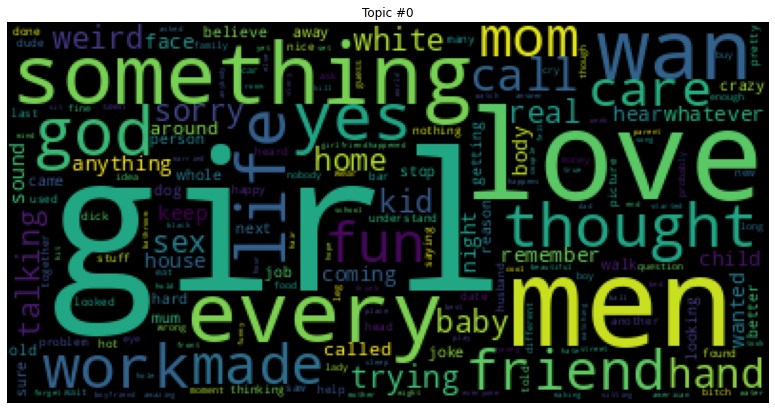

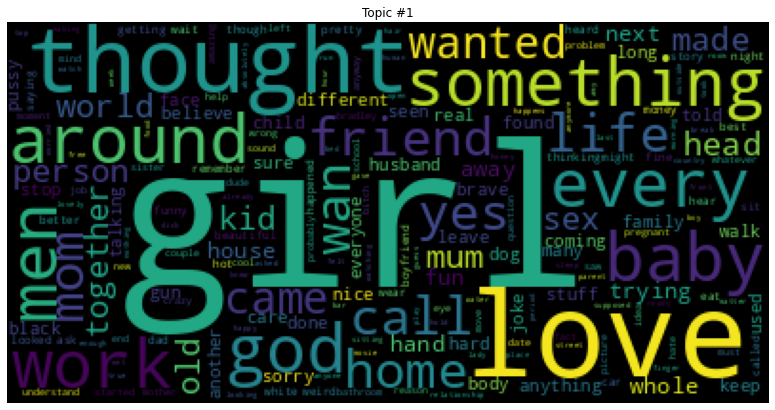

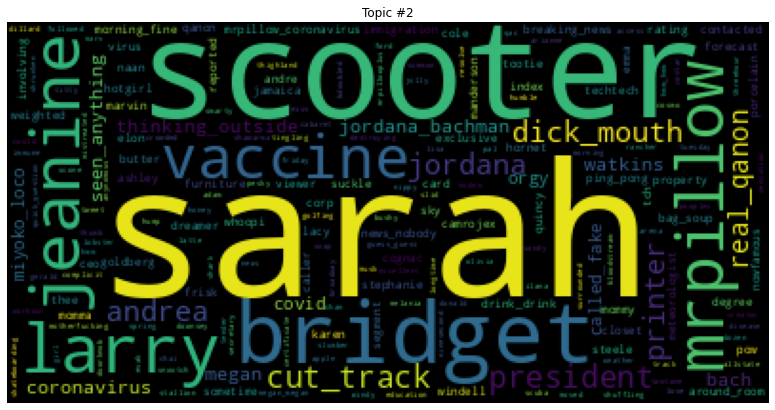

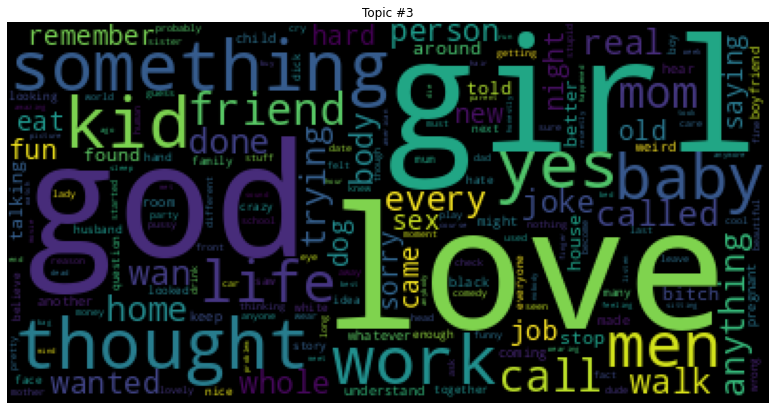

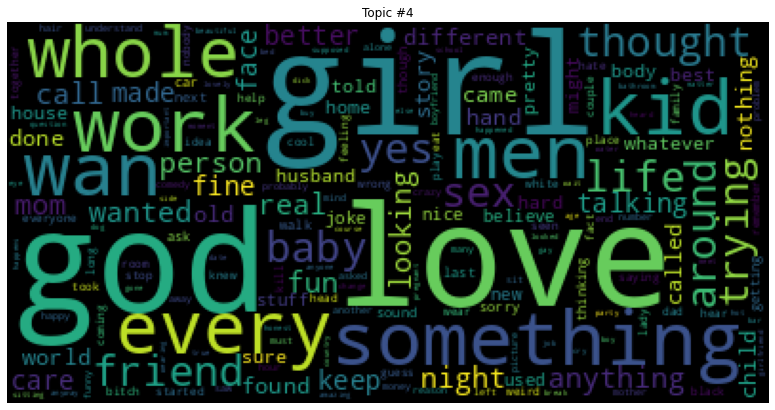

...

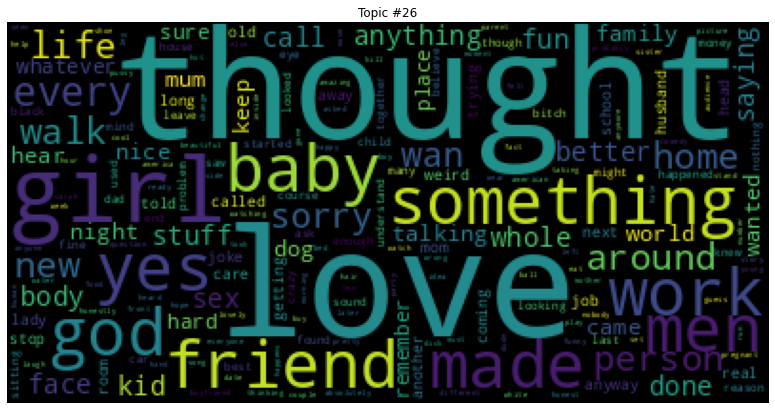

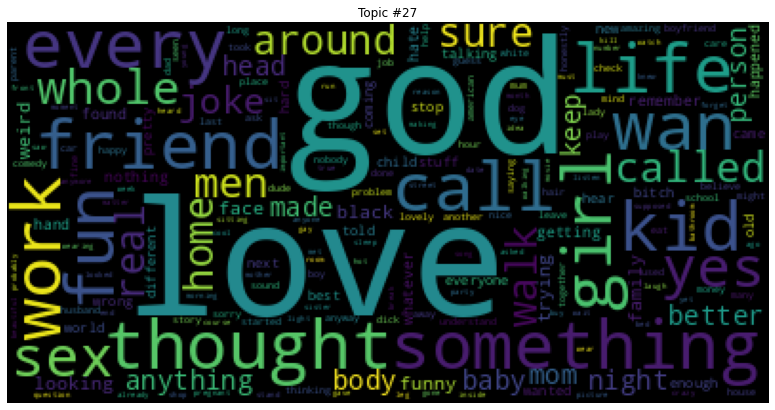

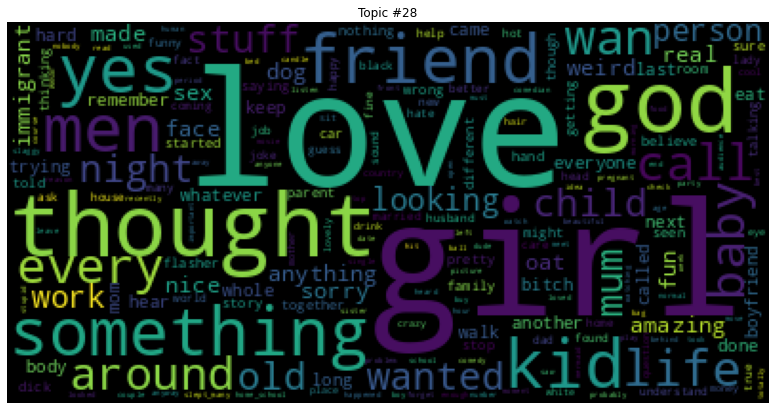

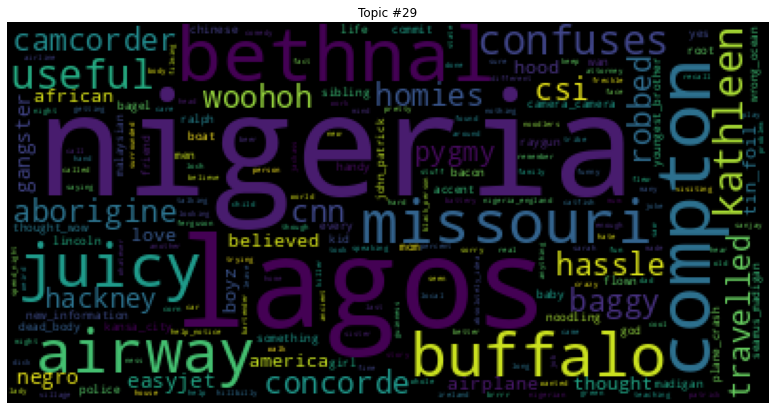

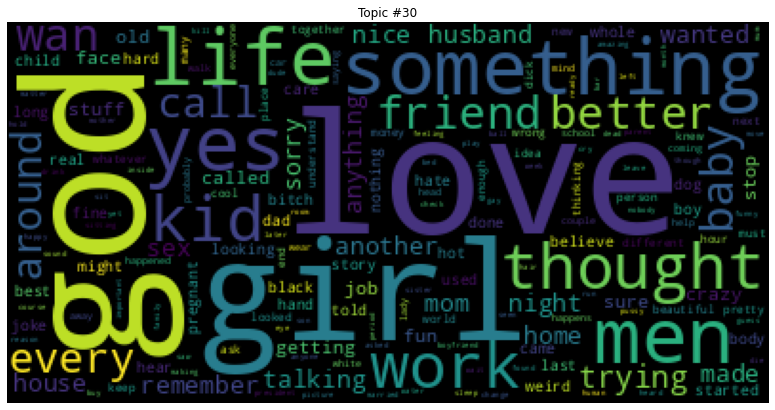

In [23]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
for t in range(lda.num_topics):
    plt.figure()
    plt.imshow(WordCloud().fit_words(dict(lda.show_topic(t, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()